## Energy+AI Micro Capstone : **Drone Detection**
- team : AIM (인공지능학부 2학년 김주완, 서가연, 조하영)
- github : url
- 실습 환경 : colab(gpu) + torch 1.12.0+cu113 
- 사용 알고리즘 : yolov5 (github 주소)

### 0. Install Dependencies

In [ ]:
#clone YOLOv5 repo
!git clone https://github.com/ultralytics/yolov5  


Cloning into 'yolov5'...
remote: Enumerating objects: 12526, done.
remote: Counting objects: 100% (74/74), done.
remote: Compressing objects: 100% (59/59), done.
remote: Total 12526 (delta 38), reused 35 (delta 15), pack-reused 12452
Receiving objects: 100% (12526/12526), 12.51 MiB | 29.79 MiB/s, done.
Resolving deltas: 100% (8574/8574), done.


In [ ]:
import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Setup complete. Using torch 1.12.0+cu113 (Tesla T4)


In [ ]:
%cd yolov5

# install dependencies
%pip install -qr requirements.txt 
%pip install -q roboflow

/content/yolov5
     |████████████████████████████████| 596 kB 5.5 MB/s 
     |████████████████████████████████| 145 kB 7.6 MB/s 
     |████████████████████████████████| 138 kB 62.5 MB/s 
     |████████████████████████████████| 178 kB 60.9 MB/s 
     |████████████████████████████████| 1.1 MB 57.6 MB/s 
     |████████████████████████████████| 54 kB 3.5 MB/s 
     |████████████████████████████████| 67 kB 8.4 MB/s 
     |████████████████████████████████| 62 kB 1.7 MB/s 


### 1. Load Custom dataset

- data source (몇 장) : kaggle url
- data labelling(annotation) : roboflow
- data augmentation(x3) : 목록 (roboflow) 

In [ ]:
from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="ultralytics")

upload and label your dataset, and get an API KEY here: https://app.roboflow.com/?model=yolov5&ref=ultralytics


In [ ]:
# set up environment
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

In [ ]:
from roboflow import Roboflow
rf = Roboflow(api_key="fkGLXDbaDekHbCOt6y7y")
project = rf.workspace("5-jcfgi").project("eai-sdcs9")
dataset = project.version(2).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to /content/datasets/EAI-2 in yolov5pytorch:: 100%|██████████| 2690/2690 [00:02<00:00, 1014.75it/s]


#### data.yaml 경로 설정

- train: ../datasets/train/images
- val: ../datasets/valid/images
- test: ../datasets/test/images

- nc: 1        # class number
- names: ['drone']     # class name

### 2. Train Custom Yolov5 Model
- img: size 416
- batch: 16
- epochs: 150 (Note: often, 3000+ are common here!)
- data: {dataset.location}/data.yaml 
- weights: 초기 학습(generic COCO pretrained model)은 yolov5s.pt로 학습 
- cache: cache images for faster training

In [ ]:
!python train.py --img 416 --batch 16 --epochs 150 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=/content/datasets/EAI-2/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=150, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
remote: Enumerating objects: 5, done.
remote: Counting objects: 100% (5/5), done.
remote: Total 5 (delta 4), reused 5 (delta 4), pack-reused 0
Unpacking objects: 100% (5/5), done.
From https://github.com/ultralytics/yolov5
 * [new branch]      update/smart_optimizer -> origin/update/smart_optimizer
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-369-g030586a 

학습 완료!

### 3. Evaluate Custom Yolov5 Detector Perfomance

In [ ]:
# Tutorial 참고 

### 4. Inference with Trained Weights
- yolov5로 학습한 weights 결과 : best.pt와 last.pt 생성
- best.pt : 가장 학습 결과가 좋은 에포크
- last.pt : 가장 마지막 에포크
- 이를 활용하여 detect.py (test 이미지 추론)


In [ ]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source {dataset.location}/test/images

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/datasets/EAI-2/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-369-g030586a Python-3.7.13 torch-1.12.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 213 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/136 /content/datasets/EAI-2/test/images/0004_jpg.rf.2e53d387e1611254f5e3b64953dcf9fc.jpg: 416x416 1 drone, Done. (0.010s)
image 2/136 /content/datasets/EAI-2/test/images/0010_jpg.rf.f1764e85b3e9328e4bdc11c22289ae7b.jpg: 416x416 3 drones, Done. (0.008s)
image 3/136 /content/datasets/EAI-2/test/images/0015_jpg.rf.3343f8704afb34ea5864c276

#### 추론 결과 시각화

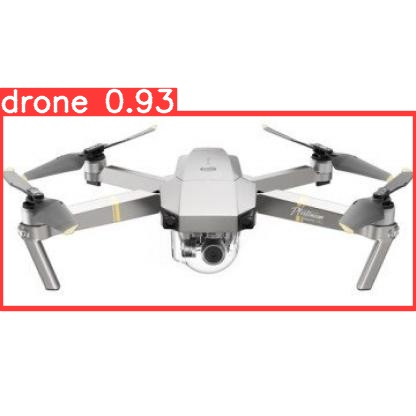

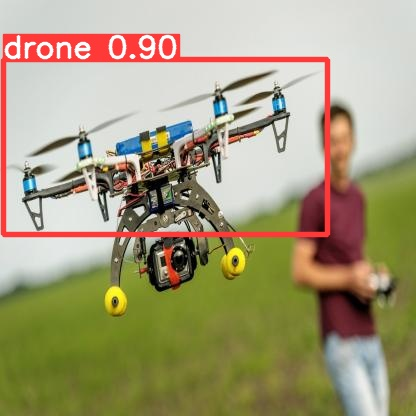

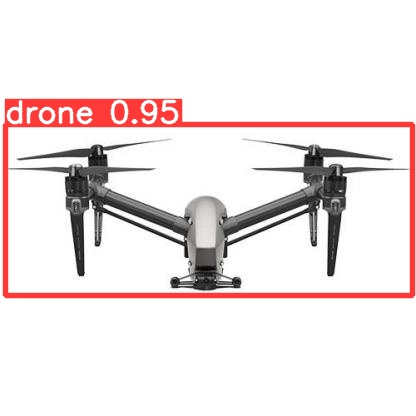

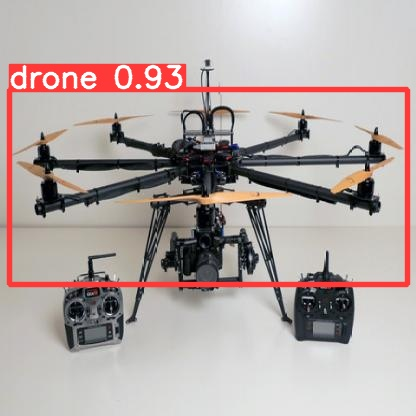

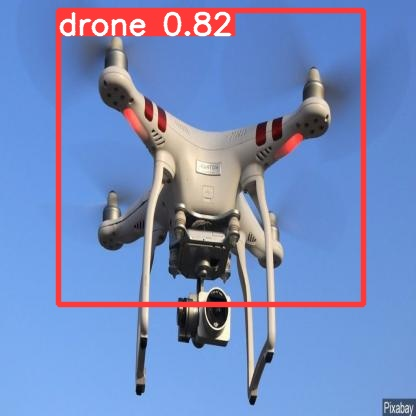

...

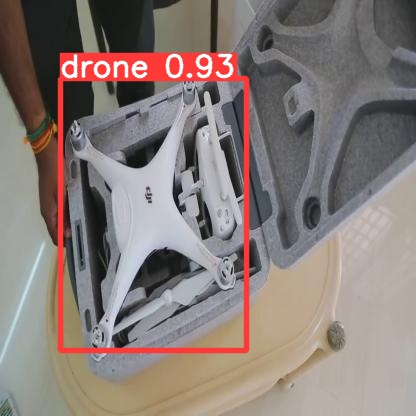

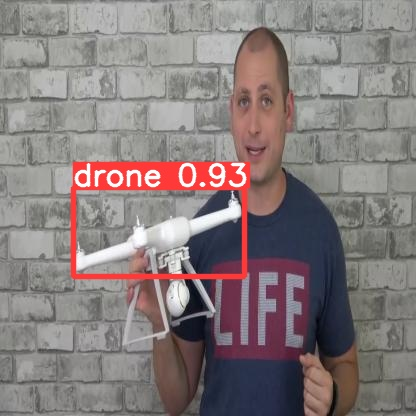

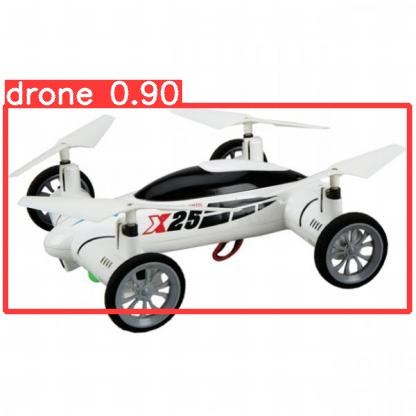

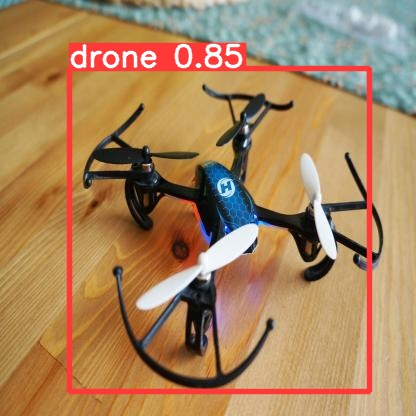

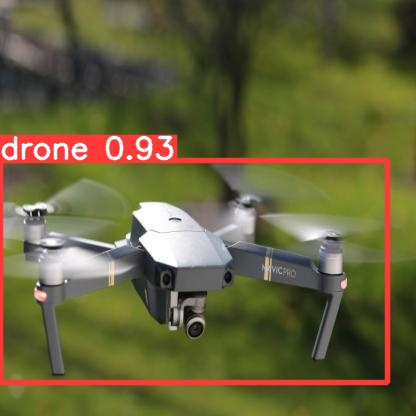

In [ ]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

### 5. Download Pretrained Model from Colab
- last.pt와 best.pt를 다운로드하여 다음 학습에 사용

In [ ]:
# export model's weights 
from google.colab import files
files.download('./runs/train/exp/weights/last.pt')
files.download('./runs/train/exp/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### 6. Load Custom Model
- 우리가 학습한 모델의 정보 확인 

In [ ]:
model = torch.hub.load('ultralytics/yolov5', 'custom', path='/content/yolov5/runs/train/exp/weights/last.pt', force_reload=True)

Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip
requirements: PyYAML>=5.3.1 not found and is required by YOLOv5, attempting auto-update...
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/

requirements: 1 package updated per /root/.cache/torch/hub/ultralytics_yolov5_master/requirements.txt
requirements: ⚠️ Restart runtime or rerun command for updates to take effect

YOLOv5 🚀 2022-8-6 Python-3.7.13 torch-1.12.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 213 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 


### 7. Make Detection with Images

In [ ]:
import torch
from matplotlib import pyplot as plt 
import numpy as np
import cv2
import seaborn as sns


In [ ]:
# 드론 이미지 url 불러오기
img = "https://assets.weforum.org/article/image/-SEFZUUSxWOm74QkKw80M7_6dvG3c6bMB6wAHvb9YVA.jpg"

results = model(img)   # 모델적용 
results.print()
results.show()  # 결과 확인


image 1/1: 2384x4240 1 drone
Speed: 1530.7ms pre-process, 40.5ms inference, 2.6ms NMS per image at shape (1, 3, 384, 640)


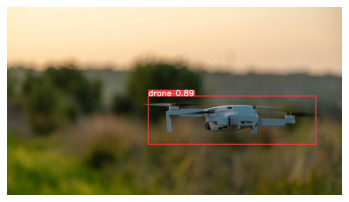

In [ ]:
%matplotlib inline 
plt.imshow(np.squeeze(results.render()))
plt.axis('off')  # 축 제거
plt.savefig('detection01.jpg', dpi=300, bbox_inches='tight')  # 사진 저장하기
plt.show()  # 시각화



In [ ]:
np.squeeze(results.render()).shape

(2384, 4240, 3)

### 8. Realtime Dectection With Webcam
- opencv를 활용한 실시간 인식

In [ ]:
cap = cv2.VideoCapture('drone.mp4')   # 0 이면 웹캠
while cap.isOpened():
    ret, frame = cap.read()
    
    # Make detections 
    results = model(frame)
    cv2.imshow('YOLO', np.squeeze(results.render()))
    
    if cv2.waitKey(10) & 0xFF == ord('q'):
        break
cap.release()
cv2.destroyAllWindows()

#### 추가 데이터셋과 best.pt로 학습하여 더 나은 성능의 모델로 학습하기!

### 9. Convert to TFLITE
- pt 파일을 tflite와 pb 파일로 export

In [ ]:
import tensorflow as tf

In [ ]:
!python export.py --weights ./runs/train/exp/weights/best.pt --imgsz 416 --include tflite 

export: data=data/coco128.yaml, weights=['./runs/train/exp/weights/best.pt'], imgsz=[416], batch_size=1, device=cpu, half=False, inplace=False, train=False, keras=False, optimize=False, int8=False, dynamic=False, simplify=False, opset=12, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['tflite']
YOLOv5 🚀 v6.1-369-g030586a Python-3.7.13 torch-1.12.0+cu113 CPU

Fusing layers... 
Model summary: 213 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs

PyTorch: starting from runs/train/exp/weights/best.pt with output shape (1, 10647, 6) (13.7 MB)

TensorFlow SavedModel: starting export with tensorflow 2.8.2...

                 from  n    params  module                                  arguments                     
2022-08-06 10:29:03.674714: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:39] Overriding allow_growth setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Or

In [ ]:
model = torch.hub.load('ultralytics/yolov5', 'custom', 'runs/train/exp/weights/best-fp16.tflite', force_reload=True)

Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip
requirements: PyYAML>=5.3.1 not found and is required by YOLOv5, attempting auto-update...
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/

requirements: 1 package updated per /root/.cache/torch/hub/ultralytics_yolov5_master/requirements.txt
requirements: ⚠️ Restart runtime or rerun command for updates to take effect

YOLOv5 🚀 2022-8-6 Python-3.7.13 torch-1.12.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

Loading runs/train/exp/weights/best-fp16.tflite for TensorFlow Lite inference...
Adding AutoShape... 


In [ ]:
model

AutoShape(
  (model): DetectMultiBackend()
)

#### tflite 파일로 추론해보기
- 이미지 사이즈 동일하게 맞추기
- 데이터셋의 data.yaml을 추가하여 클래스 라벨 출력 잘 하도록

In [ ]:
!python detect.py --weights runs/train/exp/weights/best-fp16.tflite --imgsz 416 --conf 0.25 --data=/content/datasets/EAI-2/data.yaml --source {dataset.location}/test/images

detect: weights=['runs/train/exp/weights/best-fp16.tflite'], source=/content/datasets/EAI-2/test/images, data=/content/datasets/EAI-2/data.yaml, imgsz=[416, 416], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-369-g030586a Python-3.7.13 torch-1.12.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

Loading runs/train/exp/weights/best-fp16.tflite for TensorFlow Lite inference...
INFO: Created TensorFlow Lite XNNPACK delegate for CPU.
image 1/136 /content/datasets/EAI-2/test/images/0004_jpg.rf.2e53d387e1611254f5e3b64953dcf9fc.jpg: 416x416 1 drone, Done. (0.211s)
image 2/136 /content/datasets/EAI-2/test/images/0010_jpg.rf.f1764e85b3e9328e4bdc11c22289ae7b.jpg: 416x416 3 drones, Done. (0.190s)
image 3/136

#### tflite로도 추론이 잘 되는 것을 확인! 
- tflite와 pb 파일 다운로드
- android studio에 적용하기 위함

In [ ]:
# export model's weights 
from google.colab import files
files.download('runs/train/exp/weights/best-fp16.tflite')
files.download('/content/yolov5/runs/train/exp/weights/best_saved_model/saved_model.pb')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

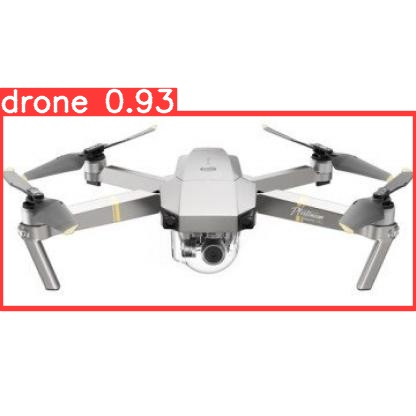

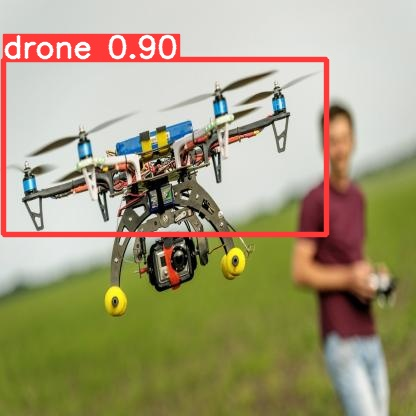

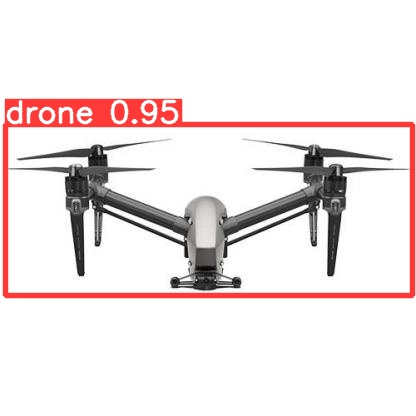

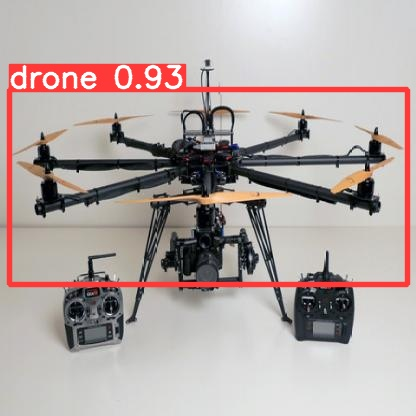

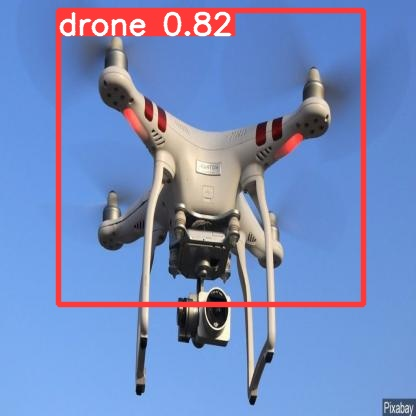

...

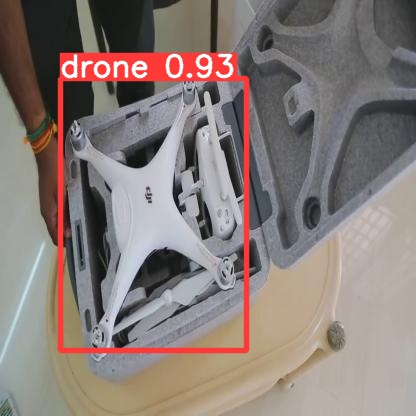

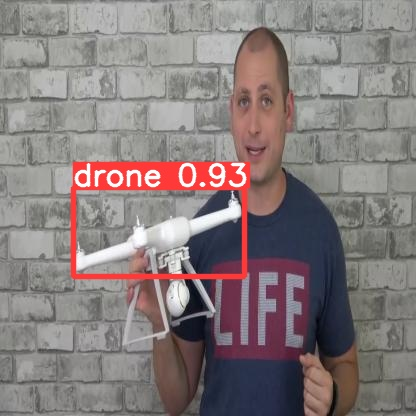

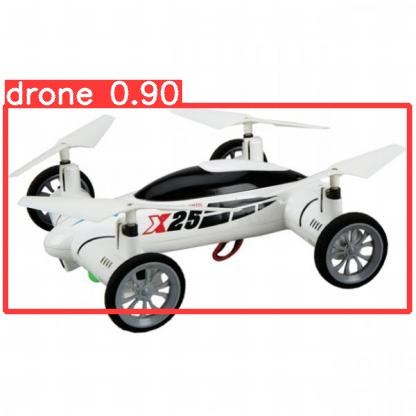

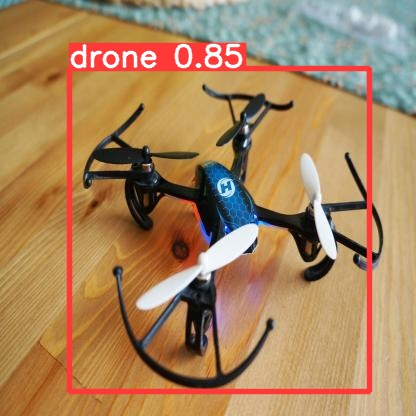

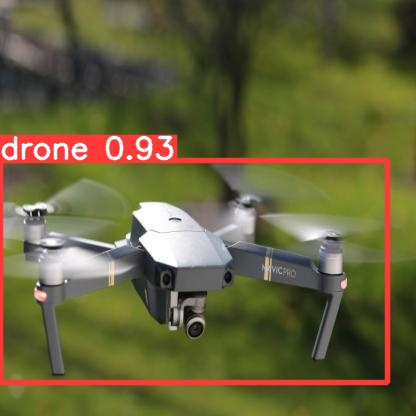

In [ ]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp6/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")